<a href="https://colab.research.google.com/github/yeesem/Advanced-Tensorflow-Specialization/blob/main/Object_Detection_Tensorflow_Hub.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [1]:
import tensorflow as tf
import tensorflow_hub as hub

import matplotlib.pyplot as plt
import numpy as np
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

import time

# Select and Load the Model

In [2]:
# you can switch the commented lines here to pick the other model

# ssd mobilenet version 2
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"

# You can choose inception resnet version 2 instead
#module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

# Load the Model

In [3]:
model = hub.load(module_handle)

In [4]:
# take a look at the available signatures for this particular model
model.signatures.keys()

KeysView(_SignatureMap({'default': <ConcreteFunction () -> Dict[['detection_scores', TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)], ['detection_class_labels', TensorSpec(shape=(None, 1), dtype=tf.int64, name=None)], ['detection_class_names', TensorSpec(shape=(None, 1), dtype=tf.string, name=None)], ['detection_boxes', TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)], ['detection_class_entities', TensorSpec(shape=(None, 1), dtype=tf.string, name=None)]] at 0x7E7BDDBD6CB0>}))

In [5]:
detector = model.signatures['default']

# Download and Resize Image

In [6]:
def display_image(image):
  fig = plt.figure(figsize = (20,15))
  plt.grid(False)
  plt.imshow(image)

def download_and_resize_image(url,new_width = 256,new_height = 256,display = False):
  # Create a temporary file ending with ".jpg"
  _,filename = tempfile.mkstemp(suffix = ".jpg")

  # Opens with given URL
  response = urlopen(url)

  # Puts the image fetched from the URL
  image_data = response.read()

  # Reads the image data in memory buffer
  image_data = BytesIO(image_data)

  # Open the image
  pil_image = Image.open(image_data)

  # Resize the image. Will crop if aspect ratio is different
  pil_image = ImageOps.fit(pil_image,(new_width,new_height),Image.ANTIALIAS)

  # Converts to the RGB colorspace
  pil_image_rgb = pil_image.convert("RGB")

  # Saves the image to the temporary file created earlier
  pil_image_rgb.save(filename,format = "JPEG",quality = 90)

  print("Image download to %s." % filename)

  if display:
    display_image(pil_image)

  return filename


<ipython-input-6-079e22e01377>:23: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image,(new_width,new_height),Image.ANTIALIAS)


Image download to /tmp/tmpeobc9ym2.jpg.


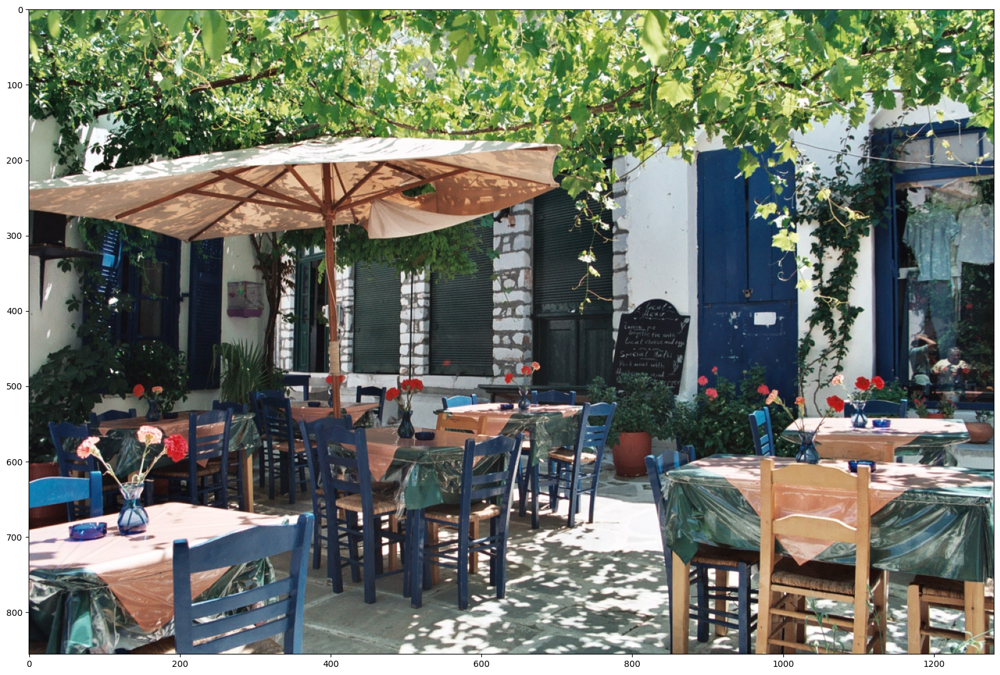

In [7]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

# Draw Bounding Box

In [18]:
def draw_bounding_box_image(
    image,
    ymin,
    xmin,
    ymax,
    xmax,
    color,
    font,
    thinkness = 4,
    display_str_list = ()
):

  draw = ImageDraw.Draw(image)
  im_width,im_height = image.size

  # Scale the bounding box coordinates to the height and width of the image
  (left,right,top,bottom) = (xmin * im_width, xmax * im_width,
                             ymin * im_height,ymax * im_height)

  # Define the edges of the detection box
  draw.line(
      [(left,top),(left,bottom),(right,bottom),(right,top),
       (left,top)],
      width = thinkness,
      fill = color
  )

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = bottom + total_display_str_height

  # Reverse list and print from bottom to top
  for display_str in display_str_list[::-1]:
      text_width, text_height = font.getsize(display_str)
      margin = np.ceil(0.05 * text_height)
      draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                      (left + text_width, text_bottom)],
                      fill=color)
      draw.text((left + margin, text_bottom - text_height - margin),
                display_str,
                fill="black",
                font=font)
      text_bottom -= text_height - 2 * margin

def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):

        # only display detection boxes that have the minimum score or higher
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")

            # draw one bounding box and overlay the class labels onto the image
            draw_bounding_box_image(image_pil,
                                       ymin,
                                       xmin,
                                       ymax,
                                       xmax,
                                       color,
                                       font,
                                       display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))

    return image


In [16]:
def load_img(path):
  # Read the file
  img = tf.io.read_file(path)

  # Convert to a tensor
  img = tf.image.decode_jpeg(img,channels = 3)

  return img

def run_detector(detector,path):
  # Load an image tensor from a local file path
  img = load_img(path)

  # Add a batch dimension in front of the tensor
  converted_img = tf.image.convert_image_dtype(img,tf.float32)[tf.newaxis,...]

  # Run inference using the model
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  # Save the results in a dictionary
  result = {key:value.numpy() for key,value in result.items()}

  # print results
  print("Found %d objects" % len(result['detection_scores']))
  print("Inference time : ",end_time - start_time)

  # Draw predicted boxed over the image
  image_with_boxes = draw_boxes(
      img.numpy(),result["detection_boxes"],
      result["detection_class_entities"],
      result["detection_scores"]
  )

  # Display the image
  display_image(image_with_boxes)

# Run the detector on you selected image

Found 100 objects
Inference time :  0.29165172576904297


<ipython-input-18-4decb966eec9>:31: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-18-4decb966eec9>:42: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


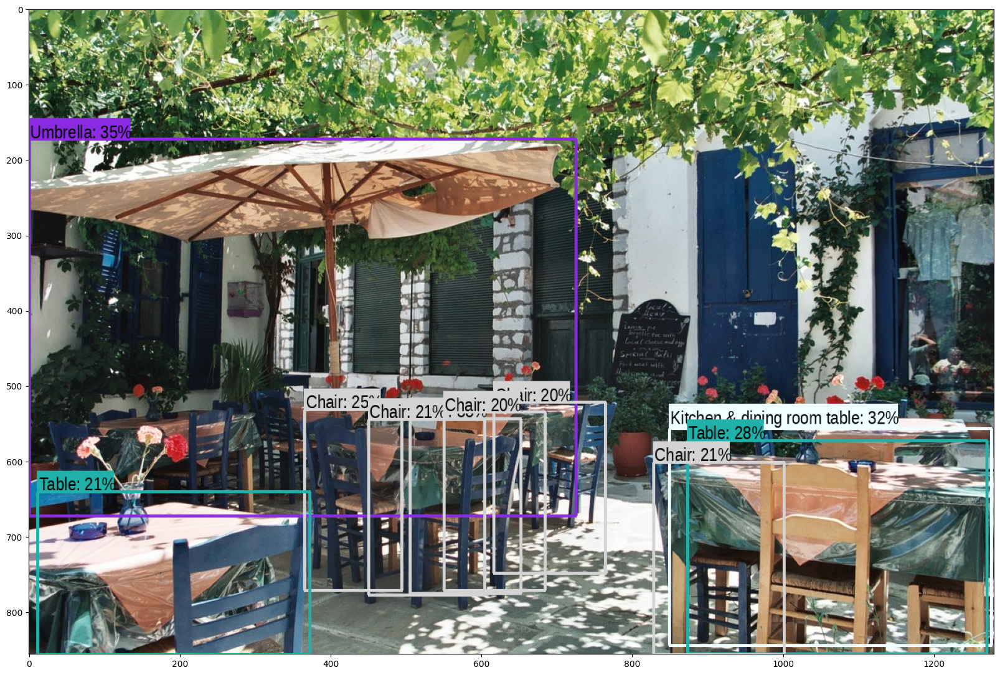

In [19]:
run_detector(detector,downloaded_image_path)

# Run the detector on more images

In [20]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480)
    run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:",end_time-start_time)

<ipython-input-6-079e22e01377>:23: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image,(new_width,new_height),Image.ANTIALIAS)


Image download to /tmp/tmpyxvx4q8e.jpg.
Found 100 objects
Inference time :  0.8012981414794922
Inference time: 1.355177402496338


<ipython-input-18-4decb966eec9>:31: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-18-4decb966eec9>:42: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


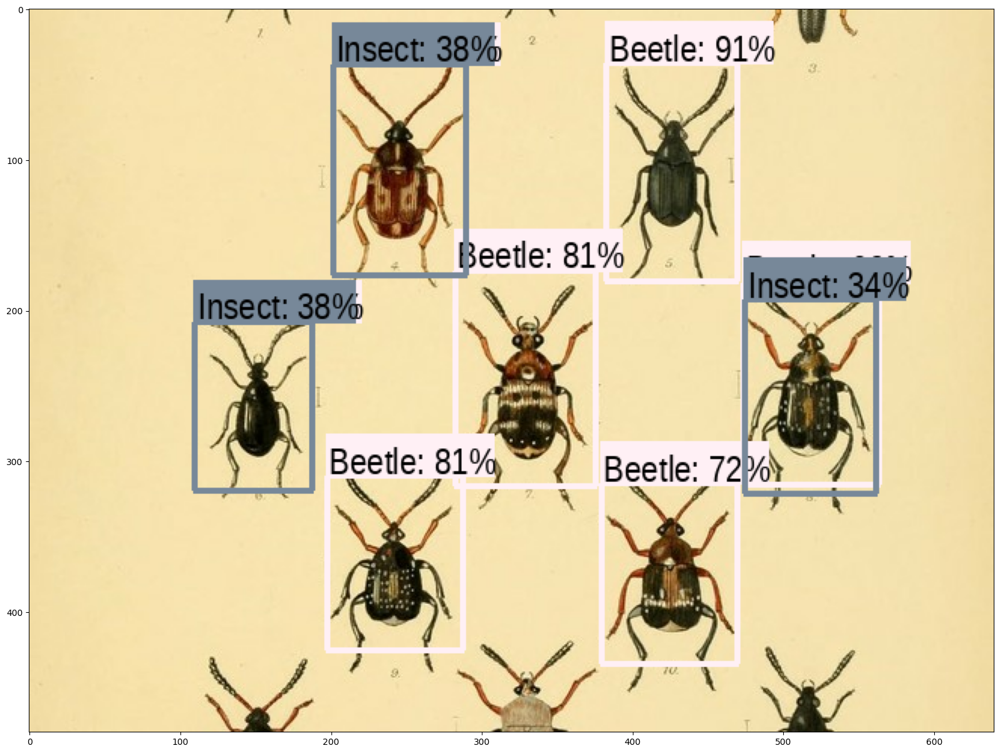

In [21]:
detect_img(image_urls[0])

<ipython-input-6-079e22e01377>:23: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image,(new_width,new_height),Image.ANTIALIAS)


Image download to /tmp/tmpz7raspg6.jpg.
Found 100 objects
Inference time :  0.40181565284729004
Inference time: 0.7134113311767578


<ipython-input-18-4decb966eec9>:31: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-18-4decb966eec9>:42: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


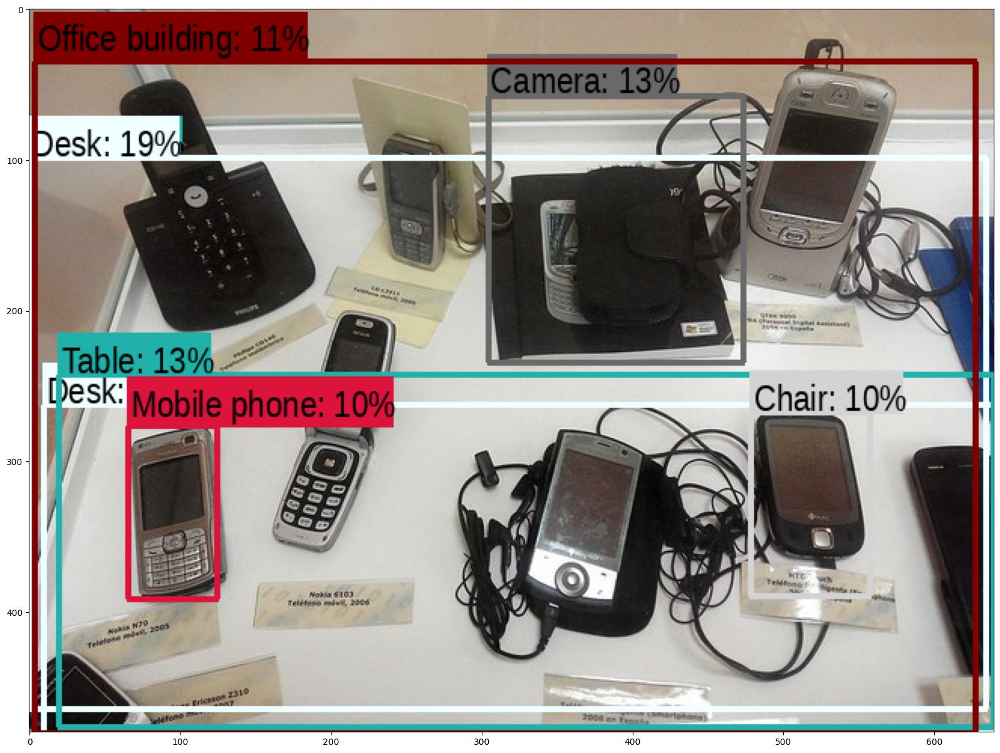

In [22]:
detect_img(image_urls[1])

<ipython-input-6-079e22e01377>:23: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image,(new_width,new_height),Image.ANTIALIAS)


Image download to /tmp/tmpt5hfyni4.jpg.
Found 100 objects
Inference time :  0.27716541290283203
Inference time: 0.6873831748962402


<ipython-input-18-4decb966eec9>:31: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-18-4decb966eec9>:42: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


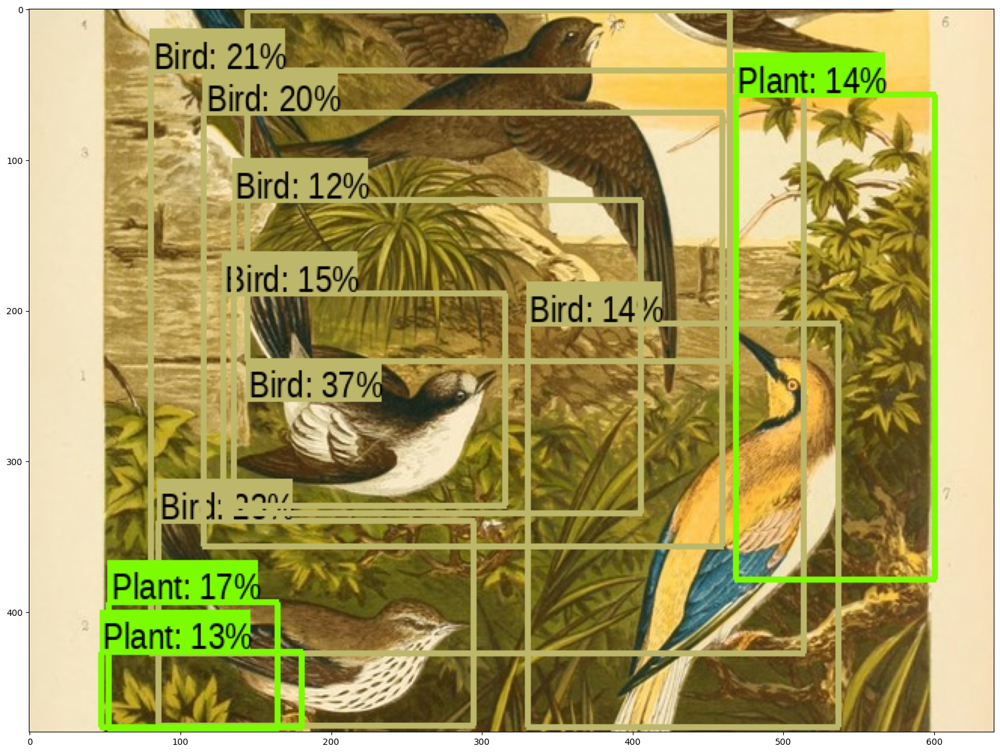

In [23]:
detect_img(image_urls[2])